***I. IMPORT DATA AND PREPARATION***

1.1 SUMMARY OF THE DATASET:

https://huggingface.co/datasets/disaster_response_messages

Dataset Summary

This dataset contains 30,000 messages drawn from events including an earthquake in Haiti in 2010, an earthquake in Chile in 2010, floods in Pakistan in 2010, super-storm Sandy in the U.S.A. in 2012, and news articles spanning a large number of years and 100s of different disasters. The data has been encoded with 36 different categories related to disaster response and has been stripped of messages with sensitive information in their entirety. Upon release, this is the featured dataset of a new Udacity course on Data Science and the AI4ALL summer school and is especially utile for text analytics and natural language processing (NLP) tasks and models.The input data in this job contains thousands of untranslated disaster-related messages and their English translations. In the “Data” tab above, you’ll find the annotated data, with 40 class labels for intent and content.

Supported Tasks and Leaderboards

The input data in this job contains thousands of untranslated disaster-related messages and their English translations. In the dataset, you’ll find the annotated data, with 40 class labels for intent and content. This dataset contains the original message in its original language, the English translation, and dozens of classes for message content. These classes are noted in column titles with a simple binary 1= yes, 0=no.


Languages

The dataset is a multilingual dataset which has the messages in the original language and also it's translated English form.

Data Fields

- split: Train, Test split
- message: English text of actual messages related to disaster
- original: Text of column 3 in native language as originally written
- genre: Type of message, including direct messages, social posting, and news stories or bulletins
- related: Is the message disaster related? 1= yes, 0=no, 2=maybe
- PII: Does the message contain PII? 1= yes, 0=no
- request: Does the message contain a request? 1= yes, 0=no
- offer: Does the message contain an offer? 1= yes, 0=no
- aid_related: Is the message aid related? 1= yes, 0=no
- medical_help: Does the message concern medical help? 1= yes, 0=no
- medical_products: Does the message concern medical products? 1= yes, 0=no
- search_and_rescue: Does the message concern search and rescue? 1= yes, 0=no
- security: Does the message concern security? 1= yes, 0=no
- military: Does the message concern military? 1= yes, 0=no
- child_alone: Does the message mention a child alone? 1= yes, 0=no
- water: Does the message concern water? 1= yes, 0=no
- food: Does the message concern food? 1= yes, 0=no
- shelter: Does the message concern shelter? 1= yes, 0=no
- clothing: Does the message concern clothing? 1= yes, 0=no
- money: Does the message concern money? 1= yes, 0=no
- missing_people: Does the message indicate missing people? 1= yes, 0=no
- refugees: Does the message concern refugess? 1= yes, 0=no
- death: Does the message imply death? 1= yes, 0=no
- other_aid: Is there any other aid needed? 1=yes, 0=no
- infrastructure_related: Does the message concern infrastructure? 1= yes, 0=no
- transport: Does the message concern transport? 1= yes, 0=no
- buildings: Does the message concern buildings? 1= yes, 0=no
- electricity: Does the message concern electricity? 1= yes, 0=no
- tools: Does the message concern tools? 1= yes, 0=no
- hospitals: Does the message concern clothing? 1= yes, 0=no
- shops: Does the message concern clothing? 1= yes, 0=no
- aid_centers:Does the message concern clothing? 1= yes, 0=no
- other_infrastructure:Does the message concern clothing? 1= yes, 0=no
- weather_related: Does the message concern weather? 1= yes, 0=no
- floods: Does the message indicate there was a flood? 1= yes, 0=no
- storm: Does the message indicate there was a storm? 1= yes, 0=no
- fire: Does the message indicate there was a fire? 1= yes, 0=no
- earthquake: Does the message indicate there was an earthquake? 1= yes, 0=no
- cold: Does the message indicate there was a cold? 1= yes, 0=no
- other_weather: Does the message indicate there was other weather issues? 1= yes, 0=no
- direct_report: Does the show a direct report? 1= yes, 0=no

1.2. IMPORT PACKAGE AND PROCESS DATA

In [1437]:
%pip install pandas

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: C:\Users\buith\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [1438]:
import pandas as pd

In [1439]:
%pip install pyLDAvis

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: C:\Users\buith\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [1440]:
%pip install nltk

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: C:\Users\buith\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [1441]:
import re

In [1442]:
import nltk
from nltk.tokenize import word_tokenize
from nltk.tokenize import sent_tokenize
from nltk.corpus import stopwords
from nltk.corpus import wordnet
from nltk import pos_tag
from nltk import ne_chunk

from nltk.stem.porter import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer


In [1443]:
pip install -U numpy

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: C:\Users\buith\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [1444]:
pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: C:\Users\buith\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [1445]:
!pip install --upgrade numpy

You should consider upgrading via the 'C:\Users\buith\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip' command.


In [1446]:
pip install wordcloud

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: C:\Users\buith\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [1447]:
import sklearn

In [1448]:
from sklearn.feature_extraction.text import CountVectorizer
import wordcloud
from wordcloud import WordCloud
# %matplotlib inline
import matplotlib.pyplot as plt

In [1449]:
from wordcloud import WordCloud, STOPWORDS

In [1450]:
df_train=pd.read_csv("disaster_response_messages_training.csv")

C:\Users\buith\AppData\Local\Temp\ipykernel_6324\4141220936.py:1: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  df_train=pd.read_csv("disaster_response_messages_training.csv")


In [1451]:
df_test=pd.read_csv("disaster_response_messages_test.csv")

In [1452]:
df_valid=pd.read_csv("disaster_response_messages_validation.csv")

In [1453]:
df_train.drop(['original'],axis=1,inplace=True)
df_test.drop(['original'],axis=1,inplace=True)
df_valid.drop(['original'],axis=1,inplace=True)

In [1454]:
df_train

,id,split,message,genre,related,PII,request,offer,aid_related,medical_help,...,aid_centers,other_infrastructure,weather_related,floods,storm,fire,earthquake,cold,other_weather,direct_report
0,2,train,Weather update - a cold front from Cuba that c...,direct,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,7,train,Is the Hurricane over or is it not over,direct,1,0,0,0,1,0,...,0,0,1,0,1,0,0,0,0,0
2,12,train,"says: west side of Haiti, rest of the country ...",direct,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,14,train,Information about the National Palace-,direct,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,15,train,Storm at sacred heart of jesus,direct,1,0,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21041,30261,train,The training demonstrated how to enhance micro...,news,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
21042,30262,train,A suitable candidate has been selected and OCH...,news,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
21043,30263,train,"Proshika, operating in Cox's Bazar municipalit...",news,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
21044,30264,train,"Some 2,000 women protesting against the conduc...",news,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [1455]:
df_test

,id,split,message,genre,related,PII,request,offer,aid_related,medical_help,...,aid_centers,other_infrastructure,weather_related,floods,storm,fire,earthquake,cold,other_weather,direct_report
0,9,test,UN reports Leogane 80-90 destroyed. Only Hospi...,direct,1,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,39,test,We are at Gressier we needs assistance right a...,direct,1,0,1,0,1,1,...,0,0,1,1,0,0,0,0,0,1
2,49,test,"Delmas 33 in Silo, need water.",direct,1,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,1
3,79,test,"SOS SOS, please provide police officers on the...",direct,1,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,1
4,99,test,"I am a driver, a mechanic ,. I want to help",direct,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2624,30189,test,"UNHCR ($653,000) is supplying basic non-food i...",news,1,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
2625,30209,test,One of the first organizations to respond to t...,news,1,0,0,0,1,0,...,0,0,1,1,0,0,0,0,0,0
2626,30239,test,The President said that her Government always ...,news,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2627,30249,test,Following the severe floods which occurred ove...,news,1,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0


In [1456]:
df_valid

,id,split,message,genre,related,PII,request,offer,aid_related,medical_help,...,aid_centers,other_infrastructure,weather_related,floods,storm,fire,earthquake,cold,other_weather,direct_report
0,8,validation,Looking for someone but no name,direct,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,18,validation,I am in Croix-des-Bouquets. We have health iss...,direct,1,0,1,0,1,1,...,0,0,0,0,0,0,0,0,0,1
2,28,validation,are you going to call me or do you want me to ...,direct,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,38,validation,"People I'm at Delma 2, we don't anything what ...",direct,1,0,1,0,1,1,...,0,0,0,0,0,0,0,0,0,1
4,48,validation,How we can find food and water? we have people...,direct,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2568,30218,validation,"""With more than 7,500 people infected already ...",news,1,0,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0
2569,30228,validation,About 70 percent of China's rivers and lakes a...,news,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2570,30238,validation,Senegal and Guinea-Bissau have agreed to condu...,news,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2571,30248,validation,WHO is recruiting a sanitary engineer / consul...,news,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [1457]:
df_train=df_train.applymap(str)
df_valid=df_valid.applymap(str)
df_test=df_test.applymap(str)

In [1458]:
def join_words(words_list):
    return ' '.join(words_list)

In [1459]:
#Set up stop words for removal
import nltk
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

nltk.download('stopwords')
from nltk.corpus import stopwords
#stopwords
stop_words=stopwords.words("english")


[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\buith\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\buith\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\buith\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2311]:
list_of_stop_words=["the", "has", "it", "with", "were", "can", "of","to","on", "this", "about", "that","was", "also", "http", "are","is", "am","some", "about","a", "an", "which", "what", "how", "when", "who","this","that","are", "the", "to", "we", "have", "in", "you", "with", "of", "what", "be", "as", "has", "from", "by", "that", "am","people","know","dont","also","would","people","please","like","would","People","Know","need","Need","Also","Like","Would","Dont","take","make","tell","well","many","Many","want","Want","cause","still","since","give","year","include","problem","place","region","number","find","provide","come","can","could","may","might","area","affect","world","person","part","thank","thanks","haiti", "information", "good", "anything", "nothing", "time","help","country","report","can","cant","cannot","can not","along","didnt","never","anymore",'havent',"without","others","natural","response","disaster","sandy","food","continue","something","even","already","continue",'disaster',"much","last","year","month","week","already", "important", "concern", "morning", "haitian", "system", "leave", "friend", "mother", "back","lose","portauprince","assisstance","relief","risk","management","support","stay","livelihood","temporary","support"]
stop_words.extend(list_of_stop_words)

In [2312]:
def preprocess(x):
    x = re.sub('[^a-z\s]', '', x.lower())
    x = re.sub(r'\b\w{1,3}\b',' ',x)
    x = re.sub(r'\d+',' ', x)
    stop_words = list(stopwords.words('english'))
    stop_words.extend(list_of_stop_words)
    x = [w for w in x.split() if w not in stop_words]
    return ' '.join(x)

In [2313]:
#mapping pos tags
def get_wordnet_pos(pos_tag):
    if pos_tag.startswith('J'):
        return wordnet.ADJ
    elif pos_tag.startswith('V'):
        return wordnet.VERB
    elif pos_tag.startswith('N'):
        return wordnet.NOUN
    elif pos_tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN

In [2314]:
#lemmatizing 
import string

def clean_text(text):
    text = [word.strip(string.punctuation) for word in text.split()]
    pos_tags = pos_tag(text)
    lemmatizer = WordNetLemmatizer()
    text = [lemmatizer.lemmatize(t[0], get_wordnet_pos(t[1])) for t in pos_tags]
    text = " ".join(text)
    return(text)

In [2315]:
df_train.head()

,id,split,message,genre,related,PII,request,offer,aid_related,medical_help,...,weather_related,floods,storm,fire,earthquake,cold,other_weather,direct_report,message_cleaned,message_cleaned_2
0,2,train,Weather update - a cold front from Cuba that c...,direct,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,weather update cold front cuba pass,weather update cold front cuba pass
1,7,train,Is the Hurricane over or is it not over,direct,1,0,0,0,1,0,...,1,0,1,0,0,0,0,0,,
2,12,train,"says: west side of Haiti, rest of the country ...",direct,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,west side rest today tonight,west side rest today tonight
3,14,train,Information about the National Palace-,direct,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,national palace,national palace
4,15,train,Storm at sacred heart of jesus,direct,1,0,0,0,0,0,...,1,0,1,0,0,0,0,0,sacred heart jesus,sacred heart jesus


In [2316]:
df_test.head()

,id,split,message,genre,related,PII,request,offer,aid_related,medical_help,...,weather_related,floods,storm,fire,earthquake,cold,other_weather,direct_report,message_cleaned,message_cleaned_2
0,9,test,UN reports Leogane 80-90 destroyed. Only Hospi...,direct,1,0,1,0,1,0,...,0,0,0,0,0,0,0,0,leogane destroy hospital croix function needs ...,leogane destroy hospital croix function needs ...
1,39,test,We are at Gressier we needs assistance right a...,direct,1,0,1,0,1,1,...,1,1,0,0,0,0,0,1,gressier assistance right away asap,gressier assistance right away asap
2,49,test,"Delmas 33 in Silo, need water.",direct,1,0,1,0,1,0,...,0,0,0,0,0,0,0,1,delmas silo,delmas silo
3,79,test,"SOS SOS, please provide police officers on the...",direct,1,0,1,0,1,0,...,0,0,0,0,0,0,0,1,police officer street insecure,police officer street insecure
4,99,test,"I am a driver, a mechanic ,. I want to help",direct,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,driver mechanic,driver mechanic


In [2317]:
df_valid.head()

,id,split,message,genre,related,PII,request,offer,aid_related,medical_help,...,weather_related,floods,storm,fire,earthquake,cold,other_weather,direct_report,message_cleaned,message_cleaned_2
0,8,validation,Looking for someone but no name,direct,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,looking someone name,looking someone name
1,18,validation,I am in Croix-des-Bouquets. We have health iss...,direct,1,0,1,0,1,1,...,0,0,0,0,0,0,0,1,croixdesbouquets health issue worker santo cro...,croixdesbouquets health issue worker santo cro...
2,28,validation,are you going to call me or do you want me to ...,direct,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,call call,call call
3,38,validation,"People I'm at Delma 2, we don't anything what ...",direct,1,0,1,0,1,1,...,0,0,0,0,0,0,0,1,delma ever medicine,delma ever medicine
4,48,validation,How we can find food and water? we have people...,direct,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,differents medicine fontamara cite tinante,differents medicine fontamara cite tinante


In [2318]:
df_train=df_train.applymap(str)
df_test=df_test.applymap(str)
df_valid=df_valid.applymap(str)

In [2319]:
def join_words(words_list):
    return ' '.join(words_list)

In [2320]:
#Set up stop words for removal
import nltk
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

nltk.download('stopwords')
from nltk.corpus import stopwords
#stopwords
stop_words=stopwords.words("english")


[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\buith\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\buith\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\buith\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2415]:
list_of_stop_words=["the", "has", "it", "with", "were", "can", "of","to","on", "this", "about", "that","was", "also", "http", "are","is", "am","some", "about","a", "an", "which", "what", "how", "when", "who","this","that","are", "the", "to", "we", "have", "in", "you", "with", "of", "what", "be", "as", "has", "from", "by", "that", "am","people","know","dont","also","would","people","please","like","would","People","Know","need","Need","Also","Like","Would","Dont","take","make","tell","well","many","Many","want","Want","cause","still","since","give","year","include","problem","place","region","number","find","provide","come","can","could","may","might","area","affect","world","person","part","thank","thanks","haiti", "information", "good", "anything", "nothing", "time","help","country","report","can","cant","cannot","can not","along","flood","water","hurricane","earthquake","storm","bitly","rain","never","anymore","without","sandy","food","response","something","even","didnt","much","especially","last","week","year","month"]
stop_words.extend(list_of_stop_words)

In [2416]:
def preprocess(x):
    x = re.sub('[^a-z\s]', '', x.lower())
    x = re.sub(r'\b\w{1,3}\b',' ',x)
    x = re.sub(r'\d+',' ', x)
    stop_words = list(stopwords.words('english'))
    stop_words.extend(list_of_stop_words)
    x = [w for w in x.split() if w not in stop_words]
    return ' '.join(x)

In [2417]:
df_train['message_cleaned']=df_train['message'].apply(clean_text)
df_test['message_cleaned']=df_test['message'].apply(clean_text)
df_valid['message_cleaned']=df_valid['message'].apply(clean_text)

In [2418]:
df_train['message_cleaned_2']=df_train['message'].apply(clean_text)
df_test['message_cleaned_2']=df_test['message'].apply(clean_text)
df_valid['message_cleaned_2']=df_valid['message'].apply(clean_text)

In [2419]:
df_train.head(2)

,id,split,message,genre,related,PII,request,offer,aid_related,medical_help,...,weather_related,floods,storm,fire,earthquake,cold,other_weather,direct_report,message_cleaned,message_cleaned_2
0,2,train,Weather update - a cold front from Cuba that c...,direct,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Weather update a cold front from Cuba that co...,Weather update a cold front from Cuba that co...
1,7,train,Is the Hurricane over or is it not over,direct,1,0,0,0,1,0,...,1,0,1,0,0,0,0,0,Is the Hurricane over or be it not over,Is the Hurricane over or be it not over


In [2420]:
df_train['message_cleaned']=df_train['message_cleaned'].apply(preprocess)
df_test['message_cleaned']=df_test['message_cleaned'].apply(preprocess)
df_valid['message_cleaned']=df_valid['message_cleaned'].apply(preprocess)

In [2421]:
df_train['message_cleaned_2']=df_train['message_cleaned'].apply(preprocess)
df_test['message_cleaned_2']=df_test['message_cleaned'].apply(preprocess)
df_valid['message_cleaned_2']=df_valid['message_cleaned'].apply(preprocess)

In [2422]:
frames=[df_train,df_test,df_valid]
df=pd.concat(frames)
df=pd.DataFrame(df.reset_index(drop=True))

In [2423]:
df_train.head(5)

,id,split,message,genre,related,PII,request,offer,aid_related,medical_help,...,weather_related,floods,storm,fire,earthquake,cold,other_weather,direct_report,message_cleaned,message_cleaned_2
0,2,train,Weather update - a cold front from Cuba that c...,direct,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,weather update cold front cuba pass,weather update cold front cuba pass
1,7,train,Is the Hurricane over or is it not over,direct,1,0,0,0,1,0,...,1,0,1,0,0,0,0,0,,
2,12,train,"says: west side of Haiti, rest of the country ...",direct,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,west side rest today tonight,west side rest today tonight
3,14,train,Information about the National Palace-,direct,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,national palace,national palace
4,15,train,Storm at sacred heart of jesus,direct,1,0,0,0,0,0,...,1,0,1,0,0,0,0,0,sacred heart jesus,sacred heart jesus


In [2424]:
df_test.head(5)

,id,split,message,genre,related,PII,request,offer,aid_related,medical_help,...,weather_related,floods,storm,fire,earthquake,cold,other_weather,direct_report,message_cleaned,message_cleaned_2
0,9,test,UN reports Leogane 80-90 destroyed. Only Hospi...,direct,1,0,1,0,1,0,...,0,0,0,0,0,0,0,0,leogane destroy hospital croix function needs ...,leogane destroy hospital croix function needs ...
1,39,test,We are at Gressier we needs assistance right a...,direct,1,0,1,0,1,1,...,1,1,0,0,0,0,0,1,gressier assistance right away asap,gressier assistance right away asap
2,49,test,"Delmas 33 in Silo, need water.",direct,1,0,1,0,1,0,...,0,0,0,0,0,0,0,1,delmas silo,delmas silo
3,79,test,"SOS SOS, please provide police officers on the...",direct,1,0,1,0,1,0,...,0,0,0,0,0,0,0,1,police officer street insecure,police officer street insecure
4,99,test,"I am a driver, a mechanic ,. I want to help",direct,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,driver mechanic,driver mechanic


In [2425]:
df_valid.head(5)

,id,split,message,genre,related,PII,request,offer,aid_related,medical_help,...,weather_related,floods,storm,fire,earthquake,cold,other_weather,direct_report,message_cleaned,message_cleaned_2
0,8,validation,Looking for someone but no name,direct,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,looking someone name,looking someone name
1,18,validation,I am in Croix-des-Bouquets. We have health iss...,direct,1,0,1,0,1,1,...,0,0,0,0,0,0,0,1,croixdesbouquets health issue worker santo cro...,croixdesbouquets health issue worker santo cro...
2,28,validation,are you going to call me or do you want me to ...,direct,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,call call,call call
3,38,validation,"People I'm at Delma 2, we don't anything what ...",direct,1,0,1,0,1,1,...,0,0,0,0,0,0,0,1,delma ever medicine,delma ever medicine
4,48,validation,How we can find food and water? we have people...,direct,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,differents medicine fontamara cite tinante,differents medicine fontamara cite tinante


In [2426]:
df.head(5)

,id,split,message,genre,related,PII,request,offer,aid_related,medical_help,...,weather_related,floods,storm,fire,earthquake,cold,other_weather,direct_report,message_cleaned,message_cleaned_2
0,2,train,Weather update - a cold front from Cuba that c...,direct,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,weather update cold front cuba pass,weather update cold front cuba pass
1,7,train,Is the Hurricane over or is it not over,direct,1,0,0,0,1,0,...,1,0,1,0,0,0,0,0,,
2,12,train,"says: west side of Haiti, rest of the country ...",direct,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,west side rest today tonight,west side rest today tonight
3,14,train,Information about the National Palace-,direct,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,national palace,national palace
4,15,train,Storm at sacred heart of jesus,direct,1,0,0,0,0,0,...,1,0,1,0,0,0,0,0,sacred heart jesus,sacred heart jesus


II. FEATURE EXTRACTION

2.1 BAG-OR-WORDS

In [2427]:
# Create a CountVectorizer object and fit it on the "message" column of the train dataframe
vectorizer_train = CountVectorizer()
train_bow = vectorizer_train.fit_transform(df_train['message_cleaned'])

# Create a CountVectorizer object and fit it on the "message" column of the test dataframe
vectorizer_test = CountVectorizer()
test_bow = vectorizer_test.fit_transform(df_test['message_cleaned'])

# Create a CountVectorizer object and fit it on the "message" column of the valid dataframe
vectorizer_valid = CountVectorizer()
valid_bow = vectorizer_valid.fit_transform(df_valid['message_cleaned'])

# Create a CountVectorizer object and fit it on the "message" column of the dataframe
vectorizer_df = CountVectorizer()
df_bow = vectorizer_df.fit_transform(df['message_cleaned'])

In [2428]:
# Create a dictionary of word frequencies from the BoW matrix for train
bow_dict_train = dict(zip(vectorizer_train.get_feature_names_out(), train_bow.sum(axis=0).tolist()[0]))
# Create a dictionary of word frequencies from the BoW matrix for test
bow_dict_test = dict(zip(vectorizer_test.get_feature_names_out(), test_bow.sum(axis=0).tolist()[0]))

# Create a dictionary of word frequencies from the BoW matrix for valid
bow_dict_valid = dict(zip(vectorizer_valid.get_feature_names_out(), valid_bow.sum(axis=0).tolist()[0]))

# Create a dictionary of word frequencies from the BoW matrix for df
bow_dict_df = dict(zip(vectorizer_df.get_feature_names_out(), df_bow.sum(axis=0).tolist()[0]))

2.2 Word Cloud

In [2429]:
# Create a word cloud
wordcloud_train = WordCloud(background_color="white").generate_from_frequencies(bow_dict_train)
wordcloud_test = WordCloud(background_color="white").generate_from_frequencies(bow_dict_test)
wordcloud_valid = WordCloud(background_color="white").generate_from_frequencies(bow_dict_valid)
wordcloud_df = WordCloud(background_color="white").generate_from_frequencies(bow_dict_df)

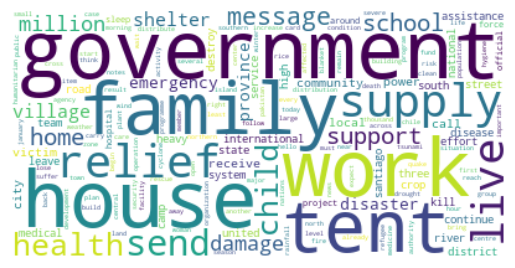

None

In [2430]:
# Train word_cloud
plt.imshow(wordcloud_train, interpolation='bilinear')
plt.axis("off")
display(plt.show())

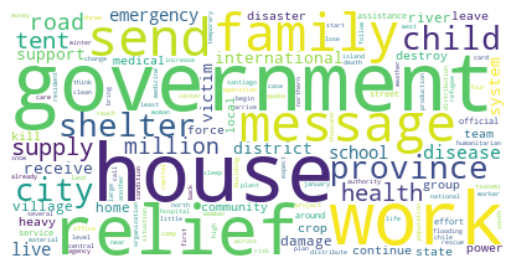

In [2431]:
# Test word_cloud
plt.imshow(wordcloud_test, interpolation='bilinear')
plt.axis("off")
plt.show()

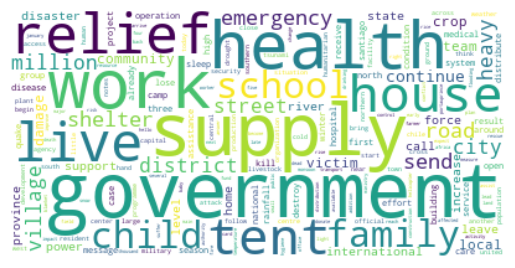

In [2432]:
# Valid word_cloud
plt.imshow(wordcloud_valid, interpolation='bilinear')
plt.axis("off")
plt.show()

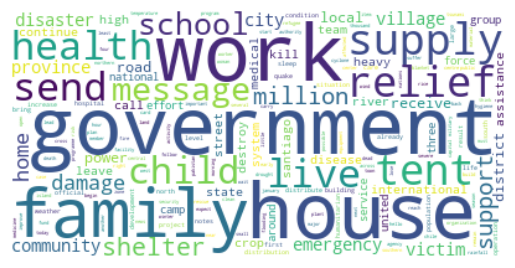

In [2433]:
# Dfword_cloud
plt.imshow(wordcloud_df, interpolation='bilinear')
plt.axis("off")
plt.show()

2.3 TF-IDF

In [2434]:
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd
from sklearn.decomposition import TruncatedSVD

# Create a TfidfVectorizer object and fit it on the "message" column of the dataframe
tfidf_df_test = TfidfVectorizer(max_features=30)
tfidf_df_test_matrix = tfidf_df_test.fit_transform(df_test['message_cleaned'])

# Create a DataFrame from the TF-IDF matrix
tfidf_df_test_matrix=pd.DataFrame(tfidf_df_test_matrix.toarray(), columns=tfidf_df_test.get_feature_names_out())
tfidf_df_test_matrix.fillna(value="", inplace=True)

In [2435]:
# Create a TfidfVectorizer object and fit it on the "message" column of the dataframe
tfidf_df_train = TfidfVectorizer(max_features=30)
tfidf_df_train_matrix = tfidf_df_train.fit_transform(df_train['message_cleaned'])

# Create a DataFrame from the TF-IDF matrix
tfidf_df_train_matrix=pd.DataFrame(tfidf_df_train_matrix.toarray(), columns=tfidf_df_train.get_feature_names_out())
tfidf_df_train_matrix.fillna(value="", inplace=True)

In [2436]:
# Create a TfidfVectorizer object and fit it on the "message" column of the dataframe
tfidf_df_valid = TfidfVectorizer(max_features=30)
tfidf_df_valid_matrix = tfidf_df_valid.fit_transform(df_valid['message_cleaned'])

# Create a DataFrame from the TF-IDF matrix
tfidf_df_valid_matrix=pd.DataFrame(tfidf_df_valid_matrix.toarray(), columns=tfidf_df_valid.get_feature_names_out())
tfidf_df_valid_matrix.fillna(value="", inplace=True)

In [2437]:
# Create a TfidfVectorizer object and fit it on the "message" column of the dataframe
tfidf_df = TfidfVectorizer(max_features=30)
tfidf_df_matrix = tfidf_df.fit_transform(df['message_cleaned'])

# Create a DataFrame from the TF-IDF matrix
tfidf_df_matrix=pd.DataFrame(tfidf_df_matrix.toarray(), columns=tfidf_df.get_feature_names_out())
tfidf_df_matrix.fillna(value="", inplace=True)

In [2438]:
tfidf_df_test_matrix.head()

,child,city,damage,disease,district,emergency,family,government,health,home,...,school,send,shelter,supply,support,system,tent,victim,village,work
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [2439]:
tfidf_df_train_matrix.head()

,call,child,city,community,damage,disaster,emergency,family,government,health,...,relief,school,send,shelter,supply,support,tent,victim,village,work
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [2440]:
tfidf_df_valid_matrix.head()

,call,child,city,community,continue,crop,damage,district,emergency,family,...,school,send,shelter,street,supply,team,tent,victim,village,work
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [2441]:
tfidf_df_matrix.head()

,child,city,community,damage,disaster,district,emergency,family,government,health,...,road,school,send,shelter,supply,support,tent,victim,village,work
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [2442]:
feature_df_names=list(tfidf_df.get_feature_names_out())
feature_train_names=list(tfidf_df_train.get_feature_names_out())
feature_test_names=list(tfidf_df_test.get_feature_names_out())
feature_valid_names=list(tfidf_df_valid.get_feature_names_out())

**2.4 Kmeans:**

**2.4.1 Find no of clusters:**

In [2443]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

In [2444]:
def elbow_draw(df, lower_range=1, higher_range=50, max_iter=100, n_init=1, random_state=42):
    import matplotlib.pyplot as plt
    from sklearn.cluster import KMeans

    # Create a list to store the SSE values for each k
    sse = []

    # Fit the KMeans model for each k and calculate the SSE
    for k in range(lower_range, higher_range):
        km = KMeans(n_clusters=k, init='k-means++', max_iter=max_iter, n_init=n_init, random_state=random_state)
        km.fit(df)
        sse.append(km.inertia_)

    # Find the elbow point (the point of maximum curvature)
    diffs = [sse[i] - sse[i-1] for i in range(1, len(sse))]
    elbow_point = diffs.index(max(diffs)) + 1

    # Plot the SSE values for each k
    plt.plot(range(lower_range, higher_range), sse)
    plt.title('Elbow Method')
    plt.xlabel('Number of Clusters')
    plt.ylabel('SSE')

    # Plot the elbow point on the graph
    plt.scatter(elbow_point, sse[elbow_point-1], marker='o', color='red')

    # Print the elbow point value
    print("The optimal number of clusters is:", elbow_point)

    plt.show()

In [2445]:
import itertools

def elbow_list(df, lower_range=1, higher_range=50, max_iter=100, n_init=1, random_state=42):
    import pandas as pd
    from sklearn.cluster import KMeans
    import numpy as np

    # Create a list to store the SSE values for each k
    sse = []

    # Fit the KMeans model for each k and calculate the SSE
    for k in range(lower_range, higher_range):
        km = KMeans(n_clusters=k, init='k-means++', max_iter=max_iter, n_init=n_init, random_state=random_state)
        km.fit(df)
        sse.append(km.inertia_)

    print("SSE values:", sse)

    # Create the elbow matrix as a Pandas DataFrame
    elbow_matrix = []
    for i in range(1, len(sse) - 1):
        row = [0] * (i+1) + list(sse[i] - np.array(sse[i+1:]))
        elbow_matrix.append(row)

    print("Elbow matrix:", elbow_matrix)

    # Flatten the elbow matrix and display as a list
    flat_elbow_matrix = list(itertools.chain.from_iterable(elbow_matrix))
    print("Flattened Elbow Matrix:", flat_elbow_matrix)
    
    return flat_elbow_matrix


The optimal number of clusters is: 48


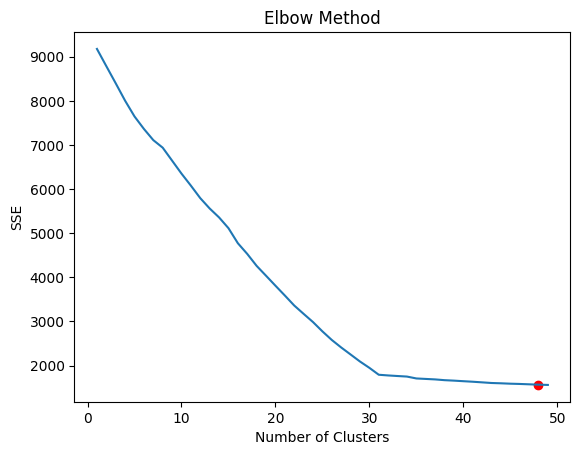

In [2446]:
elbow_draw(tfidf_df_train_matrix, max_iter=100, n_init=1, random_state=42)

The optimal number of clusters is: 37


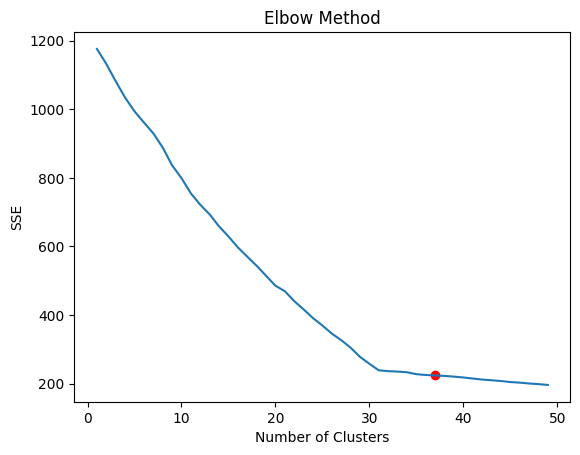

In [2447]:
elbow_draw(tfidf_df_test_matrix, max_iter=100, n_init=1, random_state=42);

The optimal number of clusters is: 34


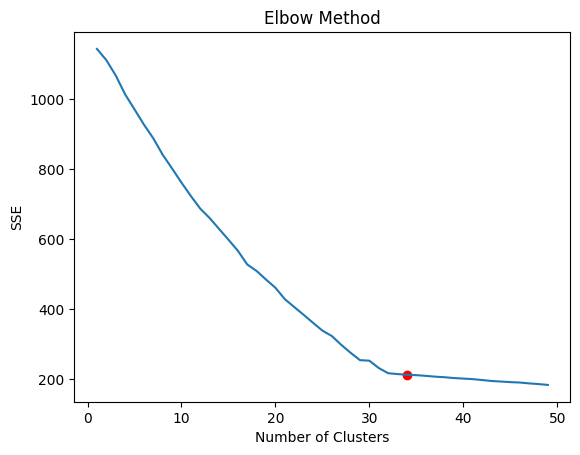

In [2448]:
elbow_draw(tfidf_df_valid_matrix, max_iter=100, n_init=1, random_state=42);

**2.4.2 Plotting**

In [2449]:
k=37
# Fit the KMeans clustering algorithm to the TF-IDF matrix
km_train = KMeans(n_clusters=k)
km_train.fit(tfidf_df_train_matrix)

# Retrieve the labels assigned to each document
labels_train = km_train.labels_

# Create a dictionary to store the text data for each cluster
cluster_train_data = {i: [] for i in range(k)}

# Filter the text data based on the cluster labels
for i, label in enumerate(labels_train):
    cluster_train_data[label].append(df_train['message_cleaned'][i])

# Compute the TF-IDF scores for each cluster
tfidf_train = TfidfVectorizer()
cluster_train_words = {}
min_cluster_size = 10 # Set the minimum number of documents for a cluster
for i in range(k):
    # Combine the documents in the cluster into a single string of text
    cluster_text_train = ' '.join(cluster_train_data[i])

    # Compute the TF-IDF scores for the words in the cluster text
    tfidf_train_matrix = tfidf_train.fit_transform([cluster_text_train])
    feature_train_names = tfidf_train.get_feature_names_out()
    tfidf_train_scores = tfidf_train_matrix.toarray()[0]

    # Retrieve the top N words with the highest TF-IDF scores and display them
    top_n = 10
    top_train_indices = tfidf_train_scores.argsort()[-top_n:][::-1]
    top_train_words = [feature_train_names[i] for i in top_train_indices]
    print(f"Cluster {i} top words: {', '.join(top_train_words)}")
    # Populate the cluster_train_words dictionary
    cluster_train_words[i] = top_train_words

# Create a Pandas DataFrame with the cluster results
df_train_cluster = pd.DataFrame({'Document': df_train['message_cleaned'], 'Cluster': labels_train})
df_train_cluster['Cluster'] = df_train_cluster['Cluster'].apply(lambda x: f"Cluster {x}")
df_train_cluster = pd.DataFrame(df_train_cluster)

C:\Users\buith\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0 top words: victim, family, january, live, tent, house, government, relief, quake, service
Cluster 1 top words: santiago, crop, disease, river, leave, high, south, heavy, state, road
Cluster 2 top words: government, official, group, force, rebel, state, north, minister, plan, military
Cluster 3 top words: tent, sleep, street, medicine, house, camp, plastic, impasse, blanket, delmas
Cluster 4 top words: live, house, tent, camp, street, santiago, family, sleep, portauprince, life
Cluster 5 top words: message, notes, important, translate, work, understand, already, concern, play, isnt
Cluster 6 top words: work, government, team, start, group, repair, system, road, case, cash
Cluster 7 top words: shelter, temporary, family, tent, live, school, survivor, sleep, house, material
Cluster 8 top words: family, house, lose, leave, tent, rice, friend, sleep, district, suffer
Cluster 9 top words: supply, hygiene, medical, baby, product, clean, system, bring, blanket, clothing
Cluster 10 to

In [2450]:
df_train_cluster

,Document,Cluster
0,weather update cold front cuba pass,Cluster 1
1,,Cluster 1
2,west side rest today tonight,Cluster 1
3,national palace,Cluster 1
4,sacred heart jesus,Cluster 1
...,...,...
21041,training demonstrate enhance micronutrient pro...,Cluster 1
21042,suitable candidate select ocha jakarta current...,Cluster 6
21043,proshika operate coxs bazar municipality union...,Cluster 8
21044,woman protest conduct election teargas converg...,Cluster 19


In [2451]:
dict_train_cluster= {}
for cluster in df_train_cluster['Cluster'].unique():
    docs = df_train_cluster.loc[df_train_cluster['Cluster'] == cluster, 'Document']
    dict_train_cluster[cluster] = docs.tolist()

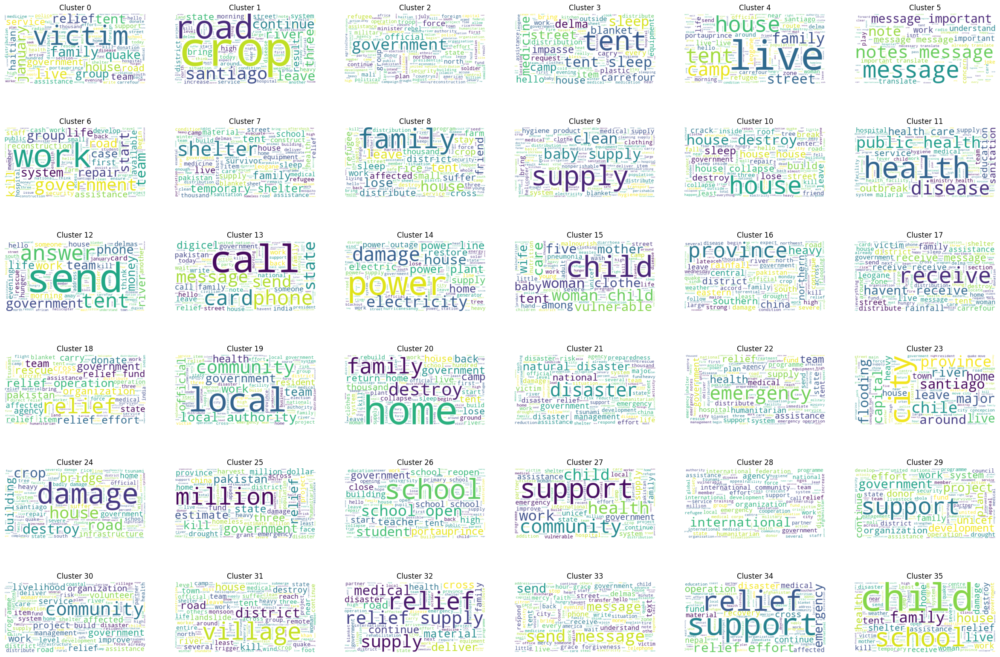

In [2452]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# create the figure and subplots
fig, axs = plt.subplots(6, 6, figsize=(30, 20))

# plot word clouds for all subplots
for i, ax in enumerate(axs.flatten()):
    if i < 37:
        text = ' '.join(dict_train_cluster[f'Cluster {i}'])
        wordcloud = WordCloud(background_color="white").generate(text)
        ax.imshow(wordcloud, interpolation='bilinear')
        ax.axis("off")
        ax.set_title(f'Cluster {i}')
    else:
        ax.axis("off")

# adjust spacing between subplots
plt.subplots_adjust(wspace=0.2, hspace=0.3)

# display the plot
plt.show()


# Cluster 32

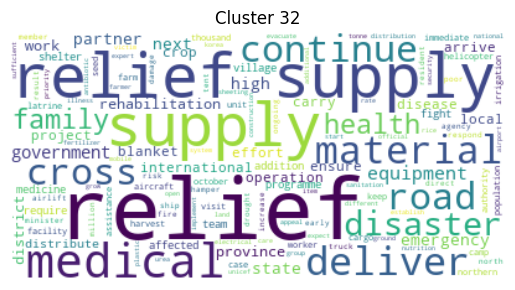

In [2453]:
cluster = 32
text = ' '.join(df_train_cluster.loc[df_train_cluster['Cluster'] == f'Cluster {cluster}']['Document'])
wordcloud = WordCloud(background_color="white").generate(text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title(f'Cluster {cluster}')
plt.show()

In [2454]:
cluster_train_word_32=df_train_cluster.loc[df_train_cluster['Cluster']=='Cluster 32']['Document']
# Split each document into a list of words
cluster_train_word_32 = cluster_train_word_32.str.split()
# Flatten the list of lists into a single list of words
cluster_train_word_32 = list(itertools.chain(*cluster_train_word_32))


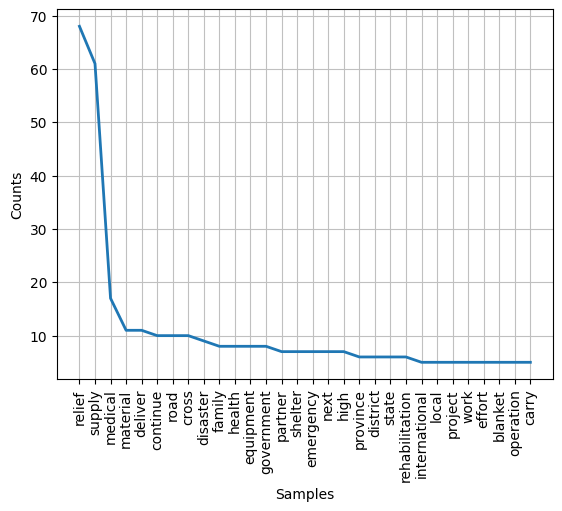

[('relief', 68), ('supply', 61), ('medical', 17), ('material', 11), ('deliver', 11), ('continue', 10), ('road', 10), ('cross', 10), ('disaster', 9), ('family', 8), ('health', 8), ('equipment', 8), ('government', 8), ('partner', 7), ('shelter', 7), ('emergency', 7), ('next', 7), ('high', 7), ('province', 6), ('district', 6)]


In [2455]:
all_words=nltk.FreqDist(cluster_train_word_32)
all_words.plot(30);
print(all_words.most_common(20))

In [2456]:
from nltk import ngrams
from nltk.probability import FreqDist

n = 3
n_grams = list(ngrams(cluster_train_word_32, n))

# Sort individual n-grams and join them into strings
n_grams_words = [' '.join(sorted(gram)) for gram in n_grams]

# Generate frequency distribution
fdist = FreqDist(n_grams_words)

In [2457]:
# Filter out words with frequency less than or equal to 2
filtered_fdist = {word: freq for word, freq in fdist.items() if freq >= 2}

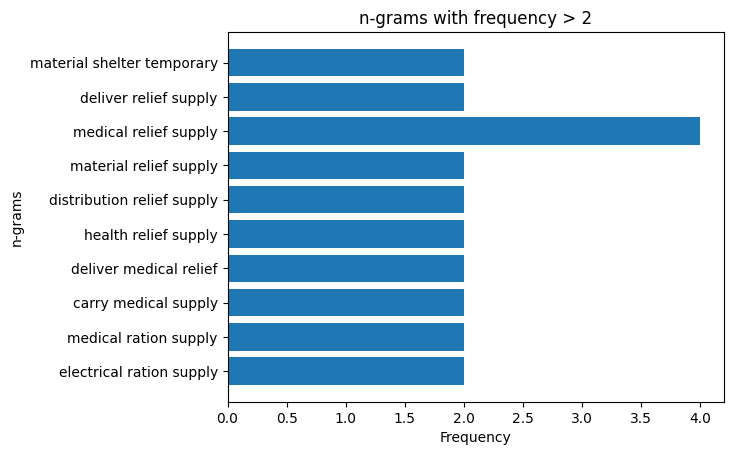

In [2458]:
fdist = FreqDist(n_grams_words)

# Get the n-grams with frequency greater than 2
top_n_grams = [(k, v) for k, v in fdist.items() if v >= 2][:10]

labels, values = zip(*top_n_grams)

plt.barh(labels, values)
plt.gca().invert_yaxis()
plt.title('n-grams with frequency > 2')
plt.xlabel('Frequency')
plt.ylabel('n-grams')
plt.show()

In [2459]:
top_n_grams 

[('material shelter temporary', 2),
 ('deliver relief supply', 2),
 ('medical relief supply', 4),
 ('material relief supply', 2),
 ('distribution relief supply', 2),
 ('health relief supply', 2),
 ('deliver medical relief', 2),
 ('carry medical supply', 2),
 ('medical ration supply', 2),
 ('electrical ration supply', 2)]

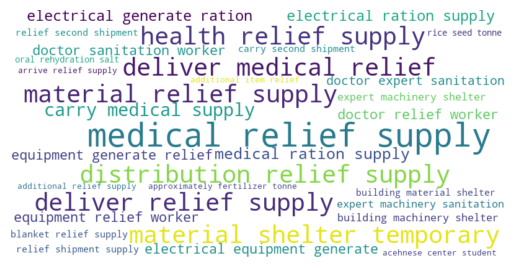

In [2460]:
# Create a WordCloud object
wc = WordCloud(width=800, height=400, max_words=50, background_color='white')

# Generate WordCloud image
wordcloud = wc.generate_from_frequencies(filtered_fdist)

# Display the WordCloud image
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

# Cluster 22

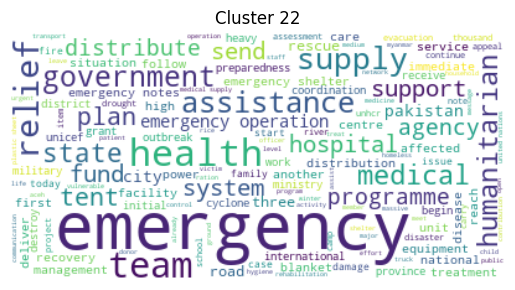

In [2461]:
cluster =22
text = ' '.join(df_train_cluster.loc[df_train_cluster['Cluster'] == f'Cluster {cluster}']['Document'])
wordcloud = WordCloud(background_color="white").generate(text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title(f'Cluster {cluster}')
plt.show()

In [2462]:
cluster_train_word_22=df_train_cluster.loc[df_train_cluster['Cluster']=='Cluster 22']['Document']
# Split each document into a list of words
cluster_train_word_22 = cluster_train_word_22.str.split()
# Flatten the list of lists into a single list of words
cluster_train_word_22 = list(itertools.chain(*cluster_train_word_22))


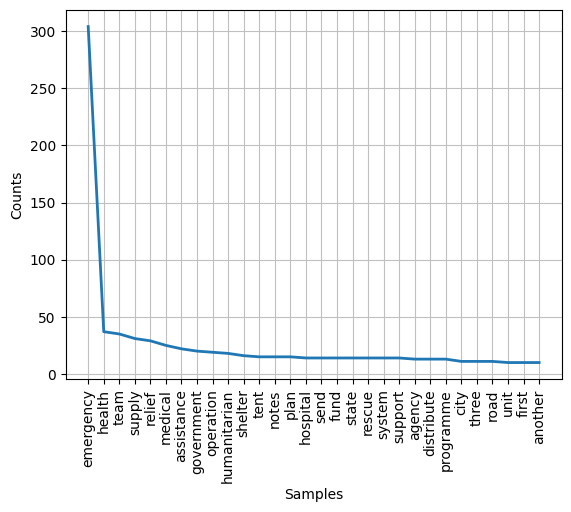

[('emergency', 304), ('health', 37), ('team', 35), ('supply', 31), ('relief', 29), ('medical', 25), ('assistance', 22), ('government', 20), ('operation', 19), ('humanitarian', 18), ('shelter', 16), ('tent', 15), ('notes', 15), ('plan', 15), ('hospital', 14), ('send', 14), ('fund', 14), ('state', 14), ('rescue', 14), ('system', 14)]


In [2463]:
all_words=nltk.FreqDist(cluster_train_word_22)
all_words.plot(30);
print(all_words.most_common(20))

In [2464]:
from nltk import ngrams
from nltk.probability import FreqDist

n = 3
n_grams = list(ngrams(cluster_train_word_22, n))

# Sort individual n-grams and join them into strings
n_grams_words = [' '.join(sorted(gram)) for gram in n_grams]

# Generate frequency distribution
fdist = FreqDist(n_grams_words)

In [2465]:
# Filter out words with frequency less than or equal to 2
filtered_fdist = {word: freq for word, freq in fdist.items() if freq > 2}

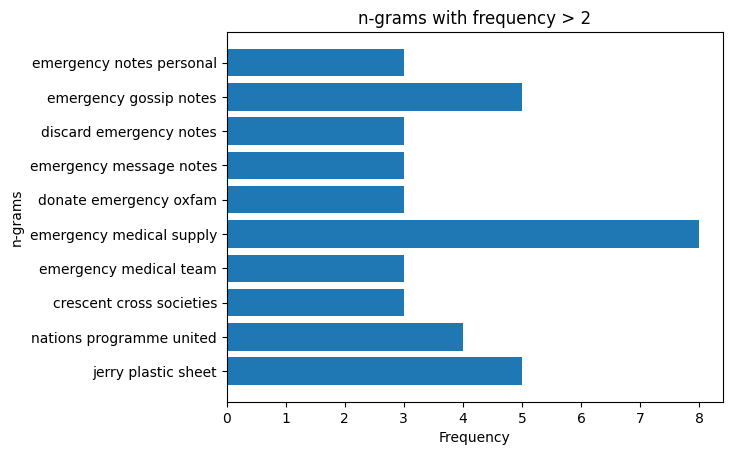

In [2466]:
fdist = FreqDist(n_grams_words)

# Get the n-grams with frequency greater than 2
top_n_grams = [(k, v) for k, v in fdist.items() if v > 2][:10]

labels, values = zip(*top_n_grams)

plt.barh(labels, values)
plt.gca().invert_yaxis()
plt.title('n-grams with frequency > 2')
plt.xlabel('Frequency')
plt.ylabel('n-grams')
plt.show()

In [2467]:
top_n_grams 

[('emergency notes personal', 3),
 ('emergency gossip notes', 5),
 ('discard emergency notes', 3),
 ('emergency message notes', 3),
 ('donate emergency oxfam', 3),
 ('emergency medical supply', 8),
 ('emergency medical team', 3),
 ('crescent cross societies', 3),
 ('nations programme united', 4),
 ('jerry plastic sheet', 5)]

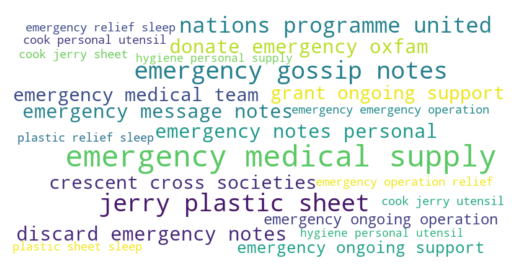

In [2468]:
# Create a WordCloud object
wc = WordCloud(width=800, height=400, max_words=50, background_color='white')

# Generate WordCloud image
wordcloud = wc.generate_from_frequencies(filtered_fdist)

# Display the WordCloud image
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

# Cluster 19

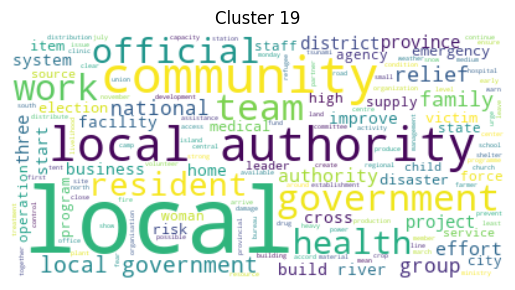

In [2469]:
cluster=19
text = ' '.join(df_train_cluster.loc[df_train_cluster['Cluster'] == f'Cluster {cluster}']['Document'])
wordcloud = WordCloud(background_color="white").generate(text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title(f'Cluster {cluster}')
plt.show()

In [2470]:
cluster_train_word_19=df_train_cluster.loc[df_train_cluster['Cluster']=='Cluster 19']['Document']
# Split each document into a list of words
cluster_train_word_19 = cluster_train_word_19.str.split()
# Flatten the list of lists into a single list of words
cluster_train_word_19 = list(itertools.chain(*cluster_train_word_19))


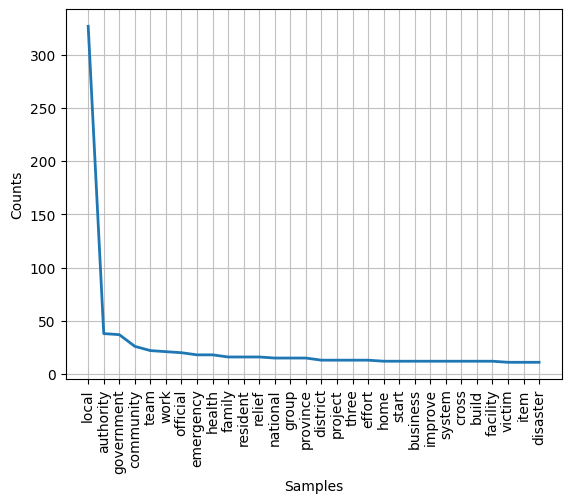

[('local', 327), ('authority', 38), ('government', 37), ('community', 26), ('team', 22), ('work', 21), ('official', 20), ('emergency', 18), ('health', 18), ('family', 16), ('resident', 16), ('relief', 16), ('national', 15), ('group', 15), ('province', 15), ('district', 13), ('project', 13), ('three', 13), ('effort', 13), ('home', 12)]


In [2471]:
all_words=nltk.FreqDist(cluster_train_word_19)
all_words.plot(30);
print(all_words.most_common(20))

In [2472]:
from nltk import ngrams
from nltk.probability import FreqDist

n = 2
n_grams = list(ngrams(cluster_train_word_19, n))

# Sort individual n-grams and join them into strings
n_grams_words = [' '.join(sorted(gram)) for gram in n_grams]

# Generate frequency distribution
fdist = FreqDist(n_grams_words)

In [2473]:
# Filter out words with frequency less than or equal to 3
filtered_fdist = {word: freq for word, freq in fdist.items() if freq >= 3}

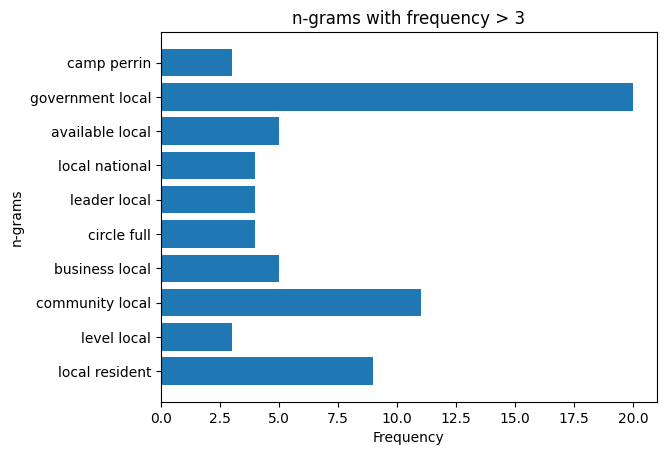

In [2474]:
fdist = FreqDist(n_grams_words)

# Get the n-grams with frequency greater than orr equal 3
top_n_grams = [(k, v) for k, v in fdist.items() if v >= 3][:10]

labels, values = zip(*top_n_grams)

plt.barh(labels, values)
plt.gca().invert_yaxis()
plt.title('n-grams with frequency > 3')
plt.xlabel('Frequency')
plt.ylabel('n-grams')
plt.show()

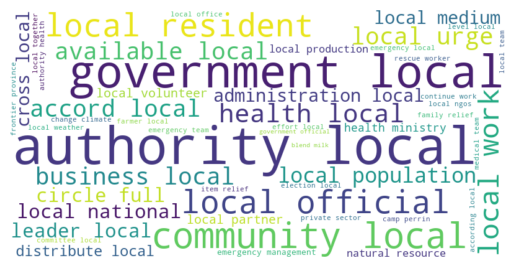

In [2475]:
# Create a WordCloud object
wc = WordCloud(width=800, height=400, max_words=50, background_color='white')

# Generate WordCloud image
wordcloud = wc.generate_from_frequencies(filtered_fdist)

# Display the WordCloud image
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [2476]:
cluster_train_word_19_revised = cluster_train_word_19.copy()

In [2477]:
words_to_remove = ['disaster','natural','response','flood']
for word in words_to_remove:
    while word in cluster_train_word_19_revised:
        cluster_train_word_19_revised.remove(word)

In [2478]:
# cluster_train_word_19_revised

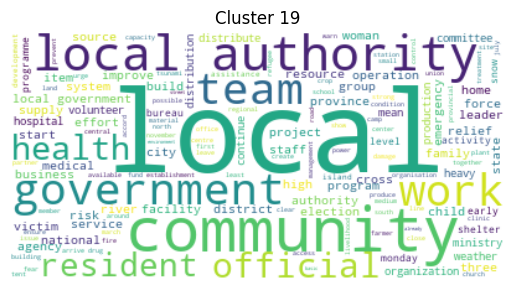

In [2479]:
text = ' '.join(cluster_train_word_19_revised)
wordcloud = WordCloud(background_color="white").generate(text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title(f'Cluster {cluster}')
plt.show()

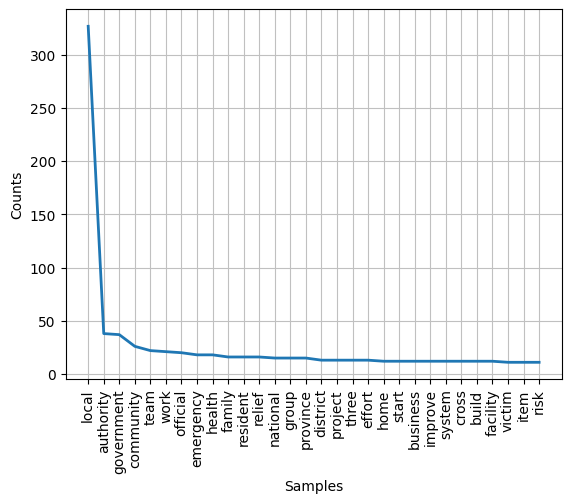

[('local', 327), ('authority', 38), ('government', 37), ('community', 26), ('team', 22), ('work', 21), ('official', 20), ('emergency', 18), ('health', 18), ('family', 16), ('resident', 16), ('relief', 16), ('national', 15), ('group', 15), ('province', 15), ('district', 13), ('project', 13), ('three', 13), ('effort', 13), ('home', 12)]


In [2480]:
all_words=nltk.FreqDist(cluster_train_word_19_revised)
all_words.plot(30);
print(all_words.most_common(20))

In [2481]:
from nltk import ngrams
from nltk.probability import FreqDist

n = 2
n_grams = list(ngrams(cluster_train_word_19_revised, n))

# Sort individual n-grams and join them into strings
n_grams_words = [' '.join(sorted(gram)) for gram in n_grams]

# Generate frequency distribution
fdist = FreqDist(n_grams_words)

In [2482]:
# Filter out words with frequency less than or equal to 3
filtered_fdist = {word: freq for word, freq in fdist.items() if freq >= 3}

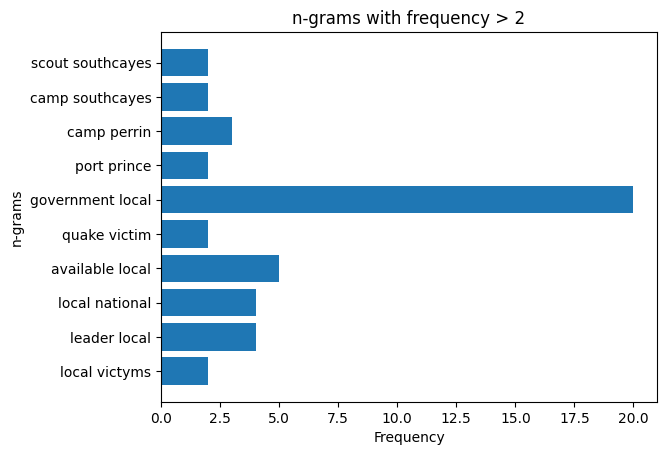

In [2483]:
fdist = FreqDist(n_grams_words)

# Get the n-grams with frequency greater than orr equal 2
top_n_grams = [(k, v) for k, v in fdist.items() if v >= 2][:10]

labels, values = zip(*top_n_grams)

plt.barh(labels, values)
plt.gca().invert_yaxis()
plt.title('n-grams with frequency > 2')
plt.xlabel('Frequency')
plt.ylabel('n-grams')
plt.show()

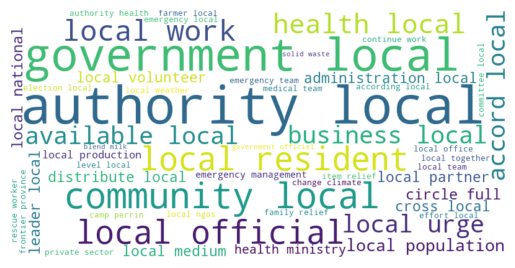

In [2484]:
# Create a WordCloud object
wc = WordCloud(width=800, height=400, max_words=50, background_color='white')

# Generate WordCloud image
wordcloud = wc.generate_from_frequencies(filtered_fdist)

# Display the WordCloud image
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

# Create n-grams

In [2485]:
from collections import Counter

In [2486]:
cluster_train_words

{0: ['victim',
  'family',
  'january',
  'live',
  'tent',
  'house',
  'government',
  'relief',
  'quake',
  'service'],
 1: ['santiago',
  'crop',
  'disease',
  'river',
  'leave',
  'high',
  'south',
  'heavy',
  'state',
  'road'],
 2: ['government',
  'official',
  'group',
  'force',
  'rebel',
  'state',
  'north',
  'minister',
  'plan',
  'military'],
 3: ['tent',
  'sleep',
  'street',
  'medicine',
  'house',
  'camp',
  'plastic',
  'impasse',
  'blanket',
  'delmas'],
 4: ['live',
  'house',
  'tent',
  'camp',
  'street',
  'santiago',
  'family',
  'sleep',
  'portauprince',
  'life'],
 5: ['message',
  'notes',
  'important',
  'translate',
  'work',
  'understand',
  'already',
  'concern',
  'play',
  'isnt'],
 6: ['work',
  'government',
  'team',
  'start',
  'group',
  'repair',
  'system',
  'road',
  'case',
  'cash'],
 7: ['shelter',
  'temporary',
  'family',
  'tent',
  'live',
  'school',
  'survivor',
  'sleep',
  'house',
  'material'],
 8: ['family',
 

In [2487]:
# Initialize a dictionary to hold the n-gram dictionaries for each topic
ngrams_dict = {}

# Define the n-gram sizes
ngram_sizes = [2, 3, 4,5,6]

In [2488]:
df_train_cluster

,Document,Cluster
0,weather update cold front cuba pass,Cluster 1
1,,Cluster 1
2,west side rest today tonight,Cluster 1
3,national palace,Cluster 1
4,sacred heart jesus,Cluster 1
...,...,...
21041,training demonstrate enhance micronutrient pro...,Cluster 1
21042,suitable candidate select ocha jakarta current...,Cluster 6
21043,proshika operate coxs bazar municipality union...,Cluster 8
21044,woman protest conduct election teargas converg...,Cluster 19


In [2489]:
# Loop through each topic and its associated word list
for topic, words in cluster_train_words.items():
    # Initialize a dictionary to hold the n-gram counts for this topic
    topic_ngrams = {}
    # Loop through the n-gram sizes
    for n in ngram_sizes:
        # Create a list of n-grams from the words in this topic
        ngrams = nltk.ngrams(words, n)
        # Count the frequency of each n-gram
        ngram_counts = Counter(ngrams)
        # Convert the Counter object to a dictionary
        ngram_dict = dict(ngram_counts)
        # Add the n-gram dictionary to the topic's n-gram dictionary
        topic_ngrams[n] = ngram_dict
    # Add the topic's n-gram dictionary to the overall n-gram dictionary
    ngrams_dict[topic] = topic_ngrams


In [2490]:
ngrams_dict.keys()

dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36])

In [2491]:
ngrams_dict.values()

dict_values([{2: {('victim', 'family'): 1, ('family', 'january'): 1, ('january', 'live'): 1, ('live', 'tent'): 1, ('tent', 'house'): 1, ('house', 'government'): 1, ('government', 'relief'): 1, ('relief', 'quake'): 1, ('quake', 'service'): 1}, 3: {('victim', 'family', 'january'): 1, ('family', 'january', 'live'): 1, ('january', 'live', 'tent'): 1, ('live', 'tent', 'house'): 1, ('tent', 'house', 'government'): 1, ('house', 'government', 'relief'): 1, ('government', 'relief', 'quake'): 1, ('relief', 'quake', 'service'): 1}, 4: {('victim', 'family', 'january', 'live'): 1, ('family', 'january', 'live', 'tent'): 1, ('january', 'live', 'tent', 'house'): 1, ('live', 'tent', 'house', 'government'): 1, ('tent', 'house', 'government', 'relief'): 1, ('house', 'government', 'relief', 'quake'): 1, ('government', 'relief', 'quake', 'service'): 1}, 5: {('victim', 'family', 'january', 'live', 'tent'): 1, ('family', 'january', 'live', 'tent', 'house'): 1, ('january', 'live', 'tent', 'house', 'government

In [2492]:
topic_ngrams.keys()

dict_keys([2, 3, 4, 5, 6])

In [2493]:
topic_ngrams.values()

dict_values([{('village', 'home'): 1, ('home', 'government'): 1, ('government', 'family'): 1, ('family', 'damage'): 1, ('damage', 'local'): 1, ('local', 'district'): 1, ('district', 'relief'): 1, ('relief', 'crop'): 1, ('crop', 'kachipul'): 1}, {('village', 'home', 'government'): 1, ('home', 'government', 'family'): 1, ('government', 'family', 'damage'): 1, ('family', 'damage', 'local'): 1, ('damage', 'local', 'district'): 1, ('local', 'district', 'relief'): 1, ('district', 'relief', 'crop'): 1, ('relief', 'crop', 'kachipul'): 1}, {('village', 'home', 'government', 'family'): 1, ('home', 'government', 'family', 'damage'): 1, ('government', 'family', 'damage', 'local'): 1, ('family', 'damage', 'local', 'district'): 1, ('damage', 'local', 'district', 'relief'): 1, ('local', 'district', 'relief', 'crop'): 1, ('district', 'relief', 'crop', 'kachipul'): 1}, {('village', 'home', 'government', 'family', 'damage'): 1, ('home', 'government', 'family', 'damage', 'local'): 1, ('government', 'fami

In [2494]:
topic_ngrams[2]

{('village', 'home'): 1,
 ('home', 'government'): 1,
 ('government', 'family'): 1,
 ('family', 'damage'): 1,
 ('damage', 'local'): 1,
 ('local', 'district'): 1,
 ('district', 'relief'): 1,
 ('relief', 'crop'): 1,
 ('crop', 'kachipul'): 1}

In [2495]:
ngrams_dict[4][2]

{('live', 'house'): 1,
 ('house', 'tent'): 1,
 ('tent', 'camp'): 1,
 ('camp', 'street'): 1,
 ('street', 'santiago'): 1,
 ('santiago', 'family'): 1,
 ('family', 'sleep'): 1,
 ('sleep', 'portauprince'): 1,
 ('portauprince', 'life'): 1}

# Wordcloud

### Bigrams

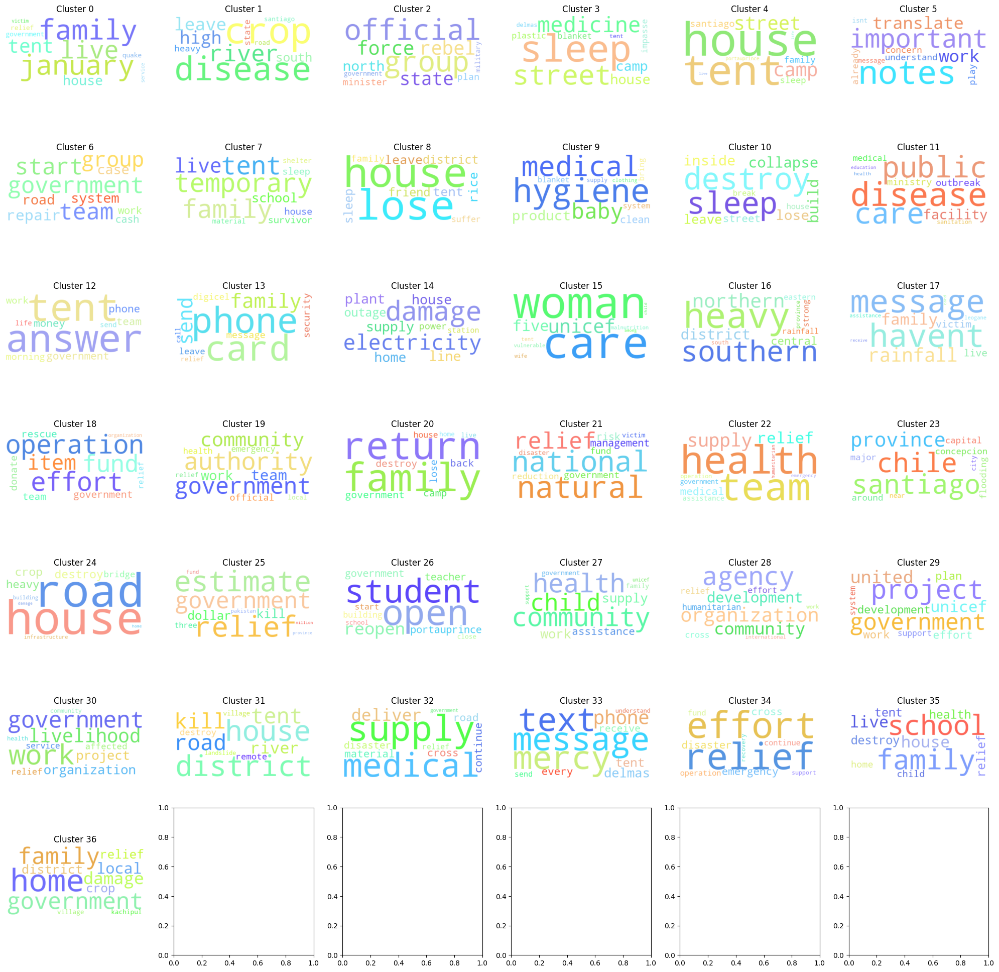

In [2496]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import random

# Define a custom color function
def random_color(word, font_size, position, orientation, random_state=None, **kwargs):
    # Return a random bright color
    return f"hsl({random.randint(0, 255)}, {random.randint(70, 100)}%, {random.randint(60, 80)}%)"

# set up the plot grid
fig, axes = plt.subplots(nrows=7, ncols=6, figsize=(20, 20))

# loop over the clusters
for i in range(len(ngrams_dict)):
    # get the bigram frequencies for this cluster
    bigram_freqs = ngrams_dict[i][2]

    # create a string of all the bigrams, weighted by their frequencies
    bigram_text = ' '.join([' '.join(bigram) for bigram, freq in bigram_freqs.items() for _ in range(freq)])

    # generate the word cloud with the custom color function
    wc = WordCloud(background_color="white", color_func=random_color, width=400, height=200).generate(bigram_text)

    # get the row and column index for this cluster
    row_idx = i // 6
    col_idx = i % 6

    # plot the word cloud in the appropriate grid cell
    axes[row_idx][col_idx].imshow(wc, interpolation='bilinear')
    axes[row_idx][col_idx].set_title(f"Cluster {i}")

    # turn off the axis labels
    axes[row_idx][col_idx].axis("off")

# display the plot
plt.tight_layout()
plt.show()

# Quadrigram

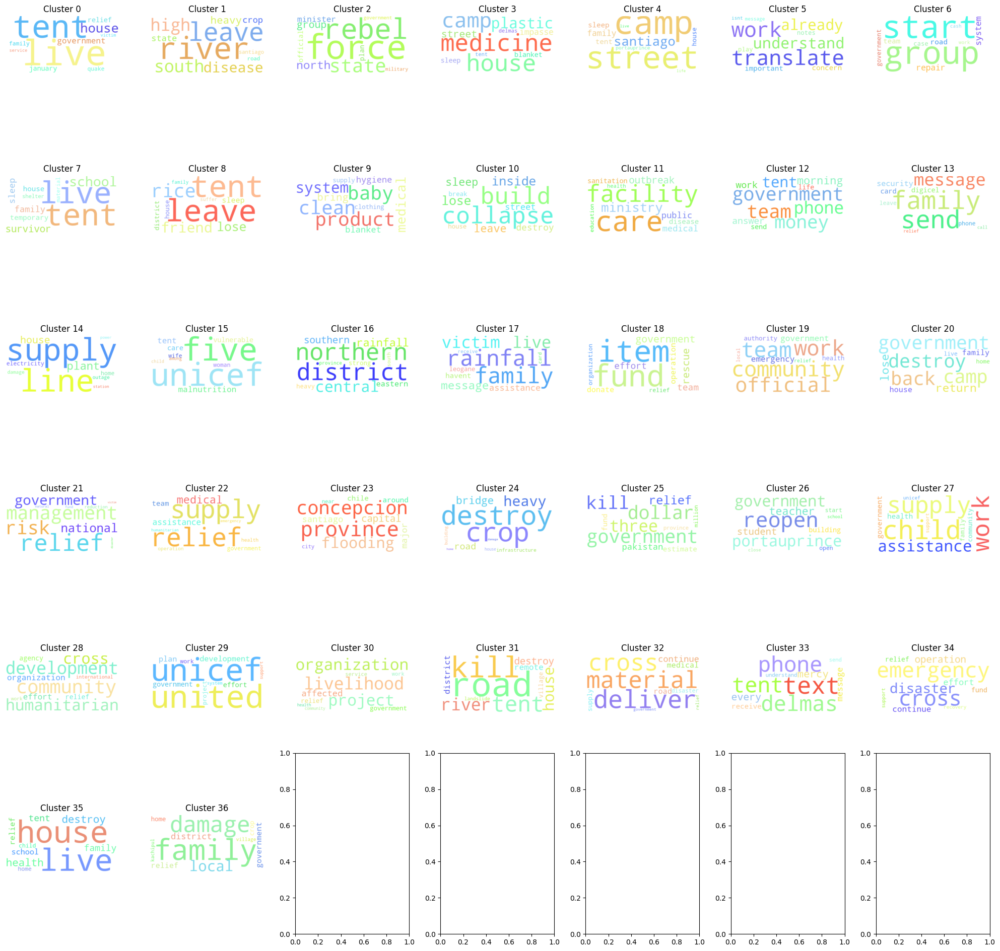

In [2497]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import random

# Define a custom color function
def random_color(word, font_size, position, orientation, random_state=None, **kwargs):
    # Return a random bright color
    return f"hsl({random.randint(0, 255)}, {random.randint(70, 100)}%, {random.randint(60, 80)}%)"

# set up the plot grid
fig, axes = plt.subplots(nrows=6, ncols=7, figsize=(20, 20))

# loop over the clusters
for i in range(len(ngrams_dict)):
    # get the bigram frequencies for this cluster
    bigram_freqs = ngrams_dict[i][4]

    # create a string of all the bigrams, weighted by their frequencies
    bigram_text = ' '.join([' '.join(bigram) for bigram, freq in bigram_freqs.items() for _ in range(freq)])

    # generate the word cloud with the custom color function
    wc = WordCloud(background_color="white", color_func=random_color, width=400, height=200).generate(bigram_text)

    # get the row and column index for this cluster
    row_idx = i // 7
    col_idx = i % 7

    # plot the word cloud in the appropriate grid cell
    axes[row_idx][col_idx].imshow(wc, interpolation='bilinear')
    axes[row_idx][col_idx].set_title(f"Cluster {i}")

    # turn off the axis labels
    axes[row_idx][col_idx].axis("off")

# display the plot
plt.tight_layout()
plt.show()

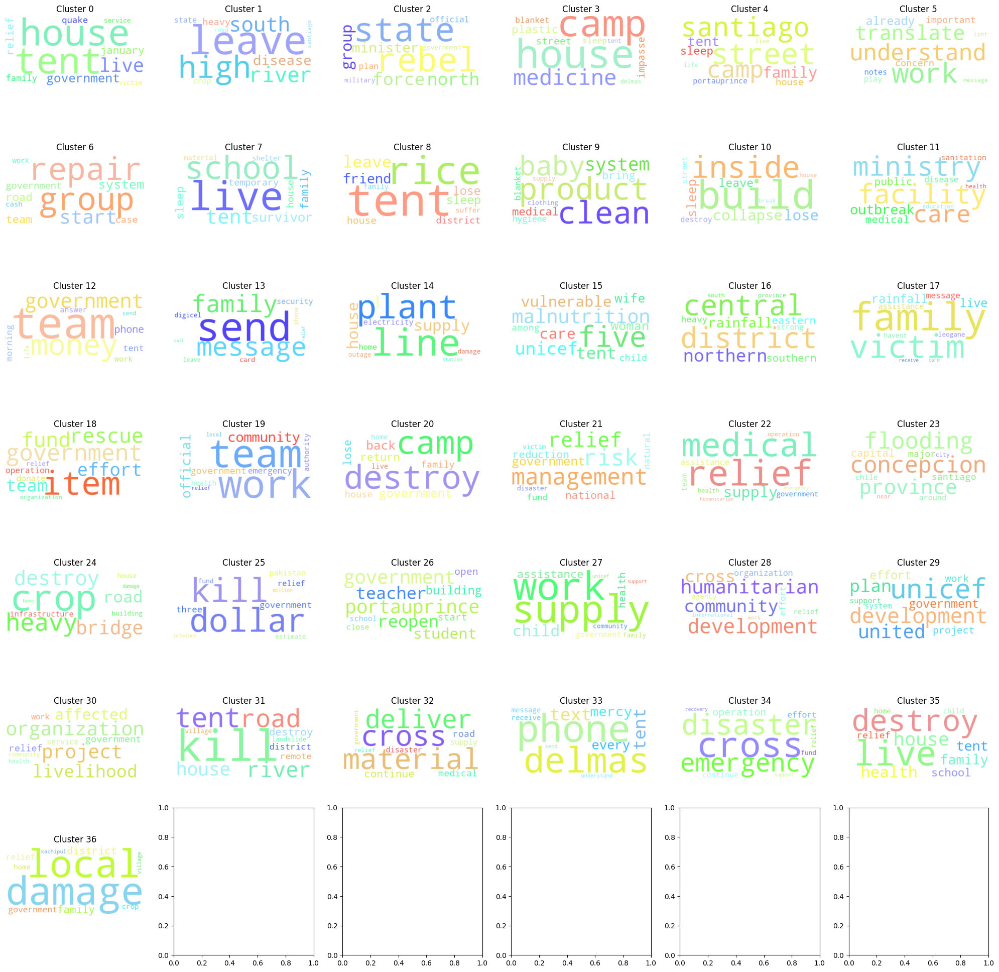

In [2498]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import random

# Define a custom color function
def random_color(word, font_size, position, orientation, random_state=None, **kwargs):
    # Return a random bright color
    return f"hsl({random.randint(0, 255)}, {random.randint(70, 100)}%, {random.randint(60, 80)}%)"

# set up the plot grid
fig, axes = plt.subplots(nrows=7, ncols=6, figsize=(20, 20))

# loop over the clusters
for i in range(len(ngrams_dict)):
    # get the bigram frequencies for this cluster
    bigram_freqs = ngrams_dict[i][5]

    # create a string of all the bigrams, weighted by their frequencies
    bigram_text = ' '.join([' '.join(bigram) for bigram, freq in bigram_freqs.items() for _ in range(freq)])

    # generate the word cloud with the custom color function
    wc = WordCloud(background_color="white", color_func=random_color, width=400, height=200).generate(bigram_text)

    # get the row and column index for this cluster
    row_idx = i // 6
    col_idx = i % 6

    # plot the word cloud in the appropriate grid cell
    axes[row_idx][col_idx].imshow(wc, interpolation='bilinear')
    axes[row_idx][col_idx].set_title(f"Cluster {i}")

    # turn off the axis labels
    axes[row_idx][col_idx].axis("off")

# display the plot
plt.tight_layout()
plt.show()

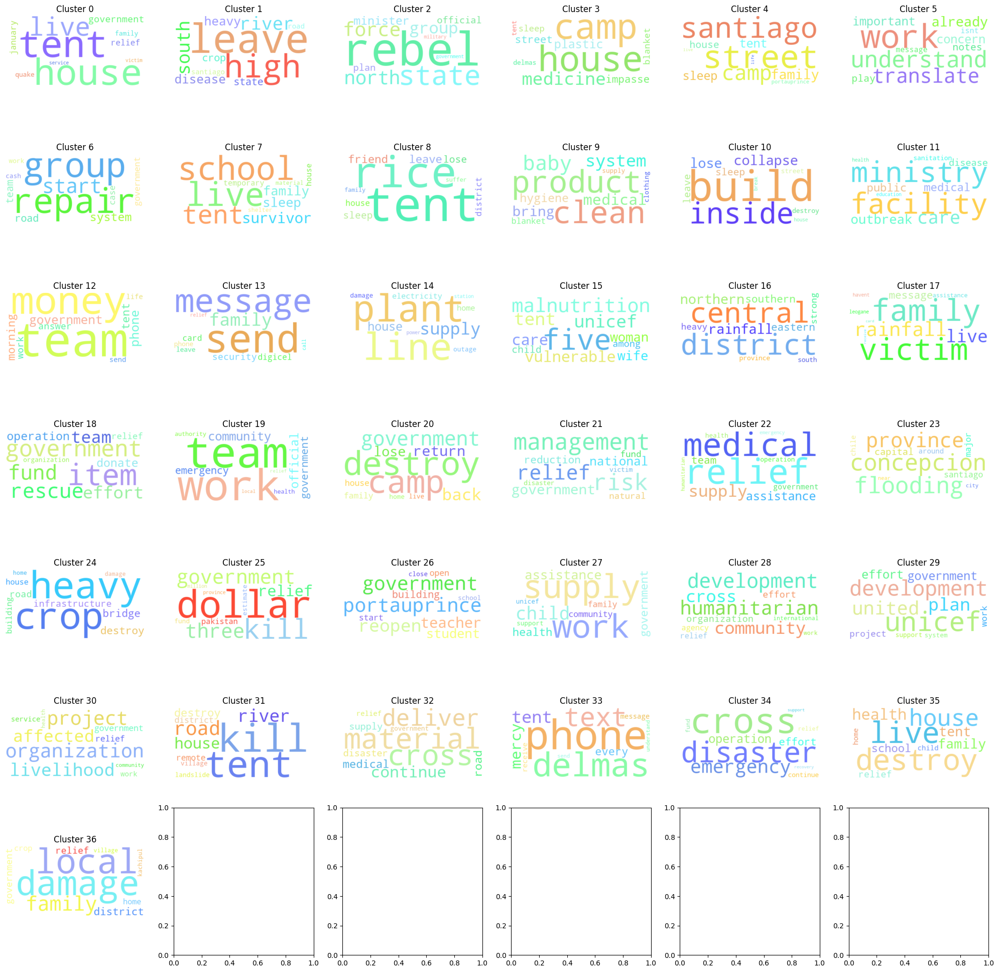

In [2499]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import random

# Define a custom color function
def random_color(word, font_size, position, orientation, random_state=None, **kwargs):
    # Return a random bright color
    return f"hsl({random.randint(0, 255)}, {random.randint(70, 100)}%, {random.randint(60, 80)}%)"

# set up the plot grid
fig, axes = plt.subplots(nrows=7, ncols=6, figsize=(20, 20))

# loop over the clusters
for i in range(len(ngrams_dict)):
    # get the bigram frequencies for this cluster
    bigram_freqs = ngrams_dict[i][6]

    # create a string of all the bigrams, weighted by their frequencies
    bigram_text = ' '.join([' '.join(bigram) for bigram, freq in bigram_freqs.items() for _ in range(freq)])

    # generate the word cloud with the custom color function
    wc = WordCloud(background_color="white", color_func=random_color, width=400, height=200).generate(bigram_text)

    # get the row and column index for this cluster
    row_idx = i // 6
    col_idx = i % 6

    # plot the word cloud in the appropriate grid cell
    axes[row_idx][col_idx].imshow(wc, interpolation='bilinear')
    axes[row_idx][col_idx].set_title(f"Cluster {i}")

    # turn off the axis labels
    axes[row_idx][col_idx].axis("off")

# display the plot
plt.tight_layout()
plt.show()

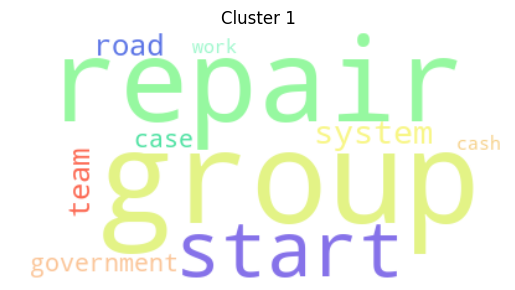

In [2500]:
# Get the bigram frequencies for cluster 1
bigram_freqs = ngrams_dict[6][6]

# Create a string of all the bigrams, weighted by their frequencies
bigram_text = ' '.join([' '.join(bigram) for bigram, freq in bigram_freqs.items() for _ in range(freq)])

# Generate the word cloud with the custom color function
wc = WordCloud(background_color="white", color_func=random_color, width=400, height=200).generate(bigram_text)

# Plot the word cloud
plt.imshow(wc, interpolation='bilinear')
plt.title("Cluster 1")

# Turn off the axis labels
plt.axis("off")

# Display the plot
plt.show()

In [2501]:
ngrams_dict[6][6]

{('work', 'government', 'team', 'start', 'group', 'repair'): 1,
 ('government', 'team', 'start', 'group', 'repair', 'system'): 1,
 ('team', 'start', 'group', 'repair', 'system', 'road'): 1,
 ('start', 'group', 'repair', 'system', 'road', 'case'): 1,
 ('group', 'repair', 'system', 'road', 'case', 'cash'): 1}

In [2502]:
bigram_freqs

{('work', 'government', 'team', 'start', 'group', 'repair'): 1,
 ('government', 'team', 'start', 'group', 'repair', 'system'): 1,
 ('team', 'start', 'group', 'repair', 'system', 'road'): 1,
 ('start', 'group', 'repair', 'system', 'road', 'case'): 1,
 ('group', 'repair', 'system', 'road', 'case', 'cash'): 1}

In [2503]:
df_train_cluster

,Document,Cluster
0,weather update cold front cuba pass,Cluster 1
1,,Cluster 1
2,west side rest today tonight,Cluster 1
3,national palace,Cluster 1
4,sacred heart jesus,Cluster 1
...,...,...
21041,training demonstrate enhance micronutrient pro...,Cluster 1
21042,suitable candidate select ocha jakarta current...,Cluster 6
21043,proshika operate coxs bazar municipality union...,Cluster 8
21044,woman protest conduct election teargas converg...,Cluster 19


In [2524]:
joint_effort=ngrams_dict[28][3]

In [2525]:
joint_effort

{('international', 'agency', 'organization'): 1,
 ('agency', 'organization', 'community'): 1,
 ('organization', 'community', 'development'): 1,
 ('community', 'development', 'humanitarian'): 1,
 ('development', 'humanitarian', 'cross'): 1,
 ('humanitarian', 'cross', 'effort'): 1,
 ('cross', 'effort', 'relief'): 1,
 ('effort', 'relief', 'work'): 1}

In [2526]:
new_text = "The international agency for development announced a new humanitarian effort to support the community."
# Tokenize the new text into 3-grams
n = 3
new_text_tokens = [tuple(new_text.split()[i:i+n]) for i in range(len(new_text.split())-n+1)]

In [2532]:
import pandas as pd

def evaluate_severity_level(new_text, severity_level_dict, n):
    # Tokenize the new text into n-grams
    new_text_tokens = [tuple(new_text[i:i+n]) for i in range(len(new_text)-n+1)]
    
    # Count the occurrences of each n-gram in the new text
    new_text_counts = {}
    for ngram in new_text_tokens:
        if ngram in new_text_counts:
            new_text_counts[ngram] += 1
        else:
            new_text_counts[ngram] = 1
    
    # Check how many n-grams from the new text match with the n-grams in the severity level dictionary
    num_matches = 0
    for ngram in new_text_counts:
        if ngram in severity_level_dict:
            num_matches += new_text_counts[ngram]
    
    # Assign a severity level to the new text based on the number of matching n-grams
    if num_matches == 0 or num_matches == 1:
        severity_level = "Low"
    elif num_matches == 2 or num_matches == 3:
        severity_level = "Medium"
    else:
        severity_level = "High"
    
    return severity_level

In [2535]:
joint_effort_severity_level = evaluate_severity_level(new_text, joint_effort, n=3)

In [2536]:
print("New text:", new_text)
print("Severity level:", joint_effort_severity_level)

New text: The international agency for development announced a new humanitarian effort to support the community.
Severity level: Low
